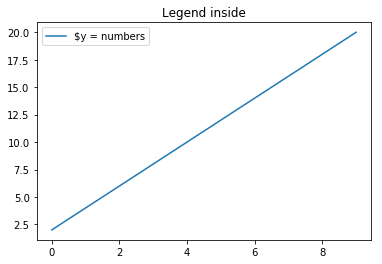

In [4]:
import matplotlib.pyplot as plt
im = plt.imread('img.jpg')
implot = plt.imshow(im)

# put a blue dot at (10, 20)
plt.scatter([10], [20])

# put a red dot, size 40, at 2 locations:
plt.scatter(x=[30, 40], y=[50, 60], c='r', s=40)
plt.scatter(x=[300, 540], y=[350, 460], c='r', s=40)
plt.scatter(x=[350, 490], y=[350, 460], c='r', s=40)
plt.scatter(x=[340, 400], y=[350, 460], c='r', s=40)


plt.show()
plt.savefig('plot.png', transparent=True)

AttributeError: 'AxesSubplot' object has no attribute 'savefig'

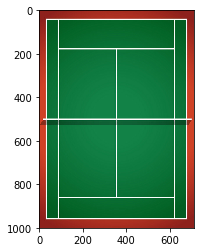

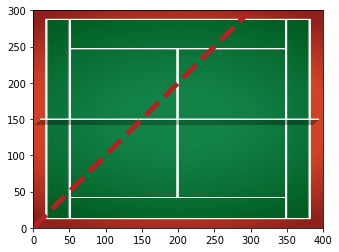

In [3]:
import matplotlib.pyplot as plt
img = plt.imread("img.jpg")
fig, ax = plt.subplots()
ax.imshow(img)

fig, ax = plt.subplots()
x = range(300)
ax.imshow(img, extent=[0, 400, 0, 300])
ax.plot(x, x, '--', linewidth=5, color='firebrick')
ax.savefig('a')

In [29]:
#640 x 360  is video stream here
import pandas as pd
df = pd.read_csv('processedResult.csv')
arrX = df['midX']
arrY = df['midY']

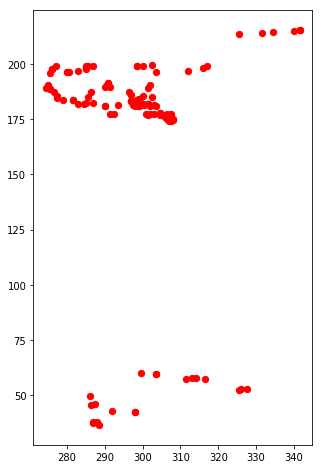

In [30]:
import matplotlib.pyplot as plt
import numpy as np


plt.figure(figsize=(5, 8))
y = np.arange(0,648,36)
x = np.arange(0,360,20)
# put a blue dot at (10, 20)
# plt.scatter([10], [20])

# put a red dot, size 40, at 2 locations:
plt.scatter(x=arrX, y=arrY, c='r', s=40)
# plt.scatter(x=[300, 540], y=[350, 460], c='r', s=40)
# plt.scatter(x=[100, 200], y=[100, 200], c='r', s=40)
# plt.scatter(x=[340, 400], y=[350, 460], c='r', s=40)



plt.savefig('plot.png', transparent=True)
plt.show()


In [42]:
#640 x 360  is video stream here
import pandas as pd
df = pd.read_csv('result.txt')

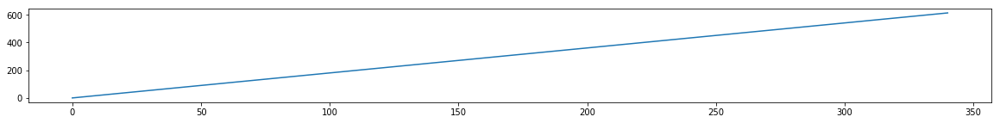

In [23]:
fig = plt.figure(figsize=(20, 2))
ax = fig.add_subplot(111)
ax.plot(x, y)

In [44]:
df['midX'] = df['left_x'] + (df['width']/2)

In [46]:
df['midY'] = df['top_y'] + (df['height']/2)

In [48]:
df.to_csv('processedResult.csv')

In [31]:
#----------PARSE OUTPUT FILE---------------------#

In [1]:
bad_words = ['cvWriteFrame', 'FPS']

with open('raw.txt') as oldfile, open('refined_1.txt', 'w') as newfile:
    for line in oldfile:
        if not any(bad_word in line for bad_word in bad_words):
            newfile.write(line)

In [2]:
with open('refined_1.txt') as oldfile:
    contents = oldfile.read()

In [3]:
contents = contents.split('Objects:')

In [4]:
contents = contents[2:-1]

In [5]:
objects = []

In [6]:
for x in contents:
    tmp = x.strip().split('\n')
    if len(tmp) > 1 or tmp[0] != '':
        tmp_refined = []
        for i in tmp:
            if i.startswith('person'):
                tmp_refined.append(i)
        objects.append(tmp_refined)

In [7]:
#Remove redundant person detections
refined_objects = []
for obj in objects:
    if len(obj) > 0:
        refined_objects.append(obj[0])

In [8]:
refined_objects

['person: 93% \t(left_x:  120   top_y:   39   width:   33   height:   90)',
 'person: 90% \t(left_x:  117   top_y:   38   width:   35   height:   89)',
 'person: 92% \t(left_x:  113   top_y:   41   width:   38   height:   84)',
 'person: 91% \t(left_x:  111   top_y:   39   width:   38   height:   85)',
 'person: 91% \t(left_x:  109   top_y:   36   width:   38   height:   90)',
 'person: 90% \t(left_x:  109   top_y:   36   width:   38   height:   89)',
 'person: 94% \t(left_x:  104   top_y:   35   width:   39   height:   90)',
 'person: 95% \t(left_x:  105   top_y:   37   width:   37   height:   87)',
 'person: 97% \t(left_x:  104   top_y:   32   width:   35   height:   88)',
 'person: 96% \t(left_x:  103   top_y:   29   width:   37   height:   92)',
 'person: 96% \t(left_x:  105   top_y:   30   width:   34   height:   90)',
 'person: 96% \t(left_x:  105   top_y:   30   width:   34   height:   89)',
 'person: 96% \t(left_x:  104   top_y:   28   width:   33   height:   89)',
 'person: 96

In [9]:
refined_objects[0].split()

['person:',
 '93%',
 '(left_x:',
 '120',
 'top_y:',
 '39',
 'width:',
 '33',
 'height:',
 '90)']

In [10]:
final_coords_X = []
final_coords_Y = []

for obj in refined_objects:
    arr = obj.split()
    leftX = arr[3]
    topY = arr[5]
    width = arr[7]
    height = arr[9][:-1]
    if leftX.isdigit() and topY.isdigit() and width.isdigit() and height.isdigit() :
        midX = int(leftX) + int(width)/2
        midY = int(topY) + int(height)/2
        final_coords_X.append(midX)
        final_coords_Y.append(midY)
        
#         print(leftX  + " " + topY + " " + width  + " " + height + " ")
#         print(midX)

In [11]:
final_coords_X

[136.5,
 134.5,
 132.0,
 130.0,
 128.0,
 128.0,
 123.5,
 123.5,
 121.5,
 121.5,
 122.0,
 122.0,
 120.5,
 120.5,
 120.0,
 120.0,
 120.0,
 120.0,
 119.5,
 119.0,
 118.5,
 119.0,
 118.5,
 118.5,
 119.0,
 120.5,
 120.0,
 121.0,
 122.0,
 122.0,
 122.5,
 123.5,
 124.0,
 128.0,
 130.0,
 130.0,
 133.0,
 135.0,
 137.0,
 138.0,
 141.0,
 141.0,
 143.0,
 144.5,
 146.0,
 147.5,
 150.5,
 150.5,
 155.5,
 156.5,
 159.0,
 163.0,
 163.0,
 164.0,
 164.5,
 165.0,
 169.0,
 164.5,
 164.0,
 164.0,
 160.5,
 157.5,
 151.5,
 151.5,
 148.5,
 149.0,
 146.0,
 142.5,
 136.5,
 133.5,
 128.0,
 121.5,
 120.5,
 120.0,
 119.0,
 116.5,
 116.5,
 117.0,
 116.0,
 117.0,
 115.5,
 116.5,
 116.5,
 116.0,
 116.5,
 118.0,
 120.0,
 120.0,
 120.0,
 122.0,
 123.0,
 123.0,
 127.5,
 128.5,
 128.5,
 132.0,
 135.0,
 137.0,
 137.5,
 138.0,
 138.0,
 141.0,
 142.5,
 143.5,
 145.5,
 147.0,
 147.0,
 148.5,
 151.0,
 151.0,
 155.5,
 155.5,
 155.5,
 157.5,
 157.5,
 158.5,
 160.0,
 161.5,
 161.5,
 163.0,
 164.0,
 163.5,
 164.0,
 166.0,
 165.0,


/home/ketkar/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


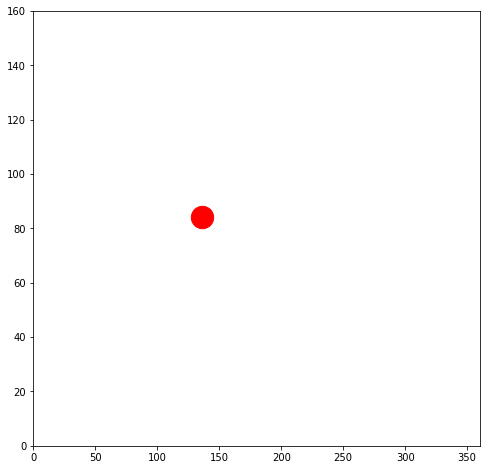

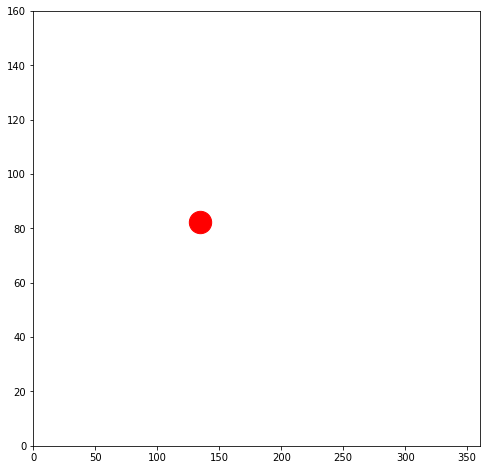

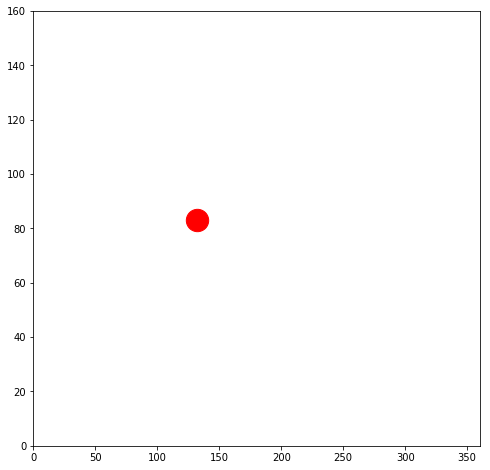

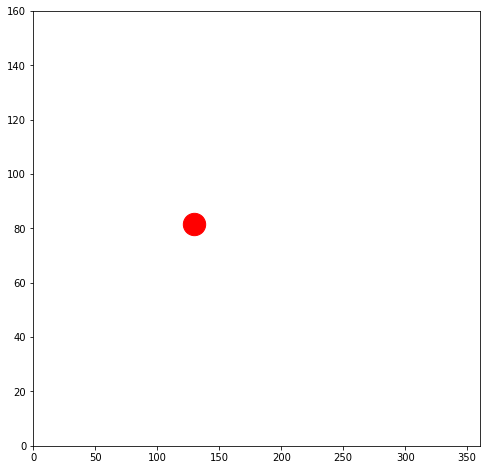

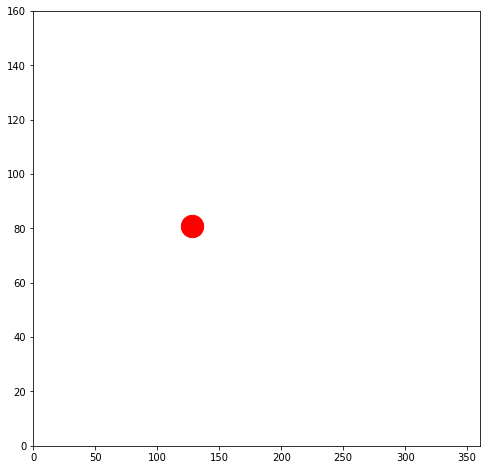

...

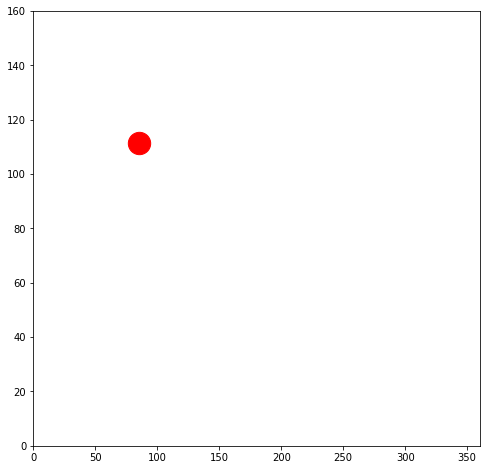

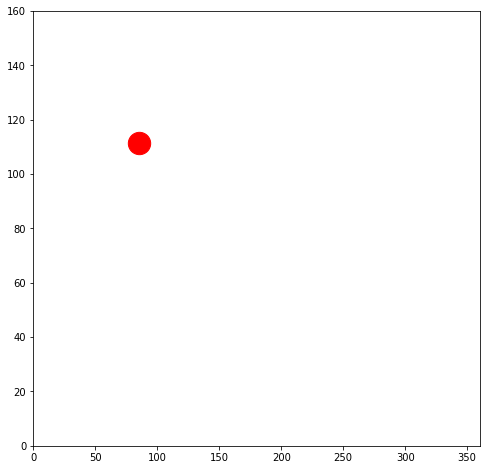

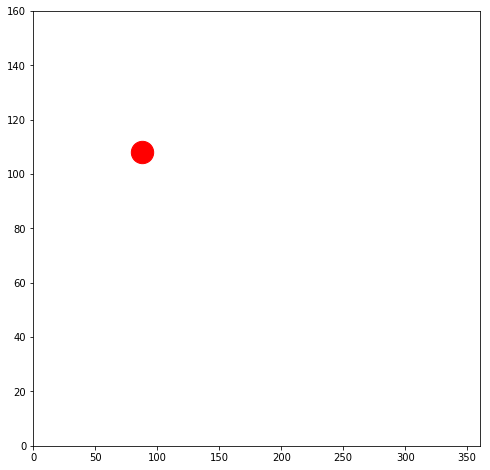

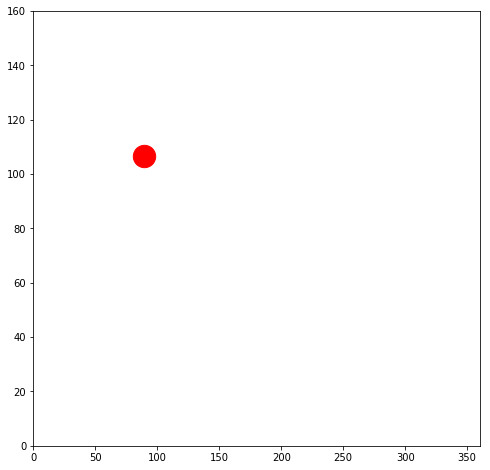

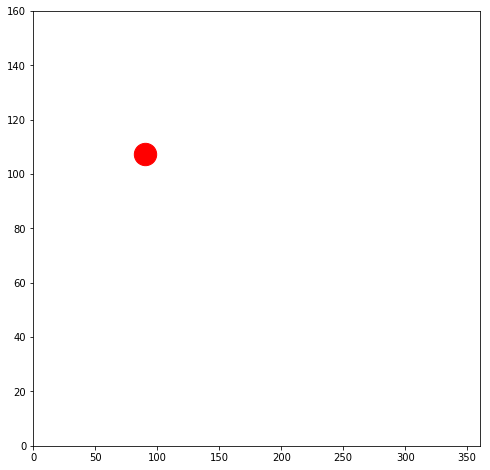

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# for i in range(len(final_coords_X)):
    
#     plt.figure(figsize=(8, 8))
#     y = np.arange(0,160,10)
#     x = np.arange(40,360,20)

#     plt.scatter(x=final_coords_X[i], y=final_coords_Y[i], c='r', s=500)
#     plt.ylim([0,160])
#     plt.xlim([0,360])
#     plt.savefig( 'points/' + str(i) + '.png', transparent=False)
# # plt.show()


In [14]:
len(final_coords_Y) 

3317

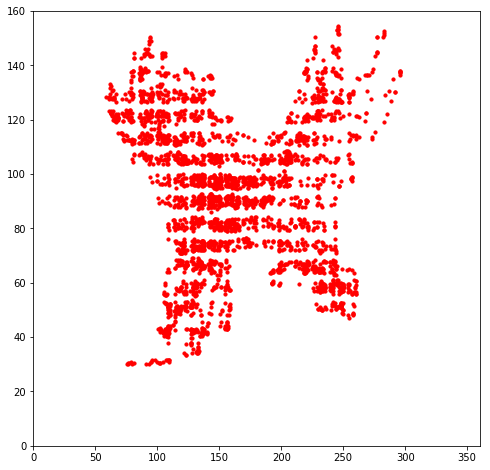

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# for i in range(len(final_coords_X)):
    
plt.figure(figsize=(8, 8))
y = np.arange(0,160,10)
x = np.arange(40,360,20)

plt.scatter(x=final_coords_X, y=final_coords_Y, c='r', s=10)
plt.ylim([0,160])
plt.xlim([0,360])
# plt.imshow(x, cmap='hot', interpolation='nearest')
# plt.savefig( 'points/' + str(i) + '.png', transparent=False)
plt.show()


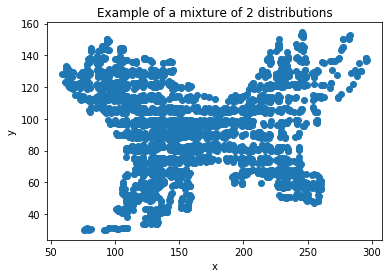

In [101]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
from sklearn.datasets.samples_generator import make_blobs

std = 0.1
n_components = 2
X, truth = make_blobs(n_samples=3317, centers=n_components,cluster_std=[std,std,std,std])

plt.scatter(final_coords_X, final_coords_Y)
plt.title(f"Example of a mixture of {n_components} distributions")
plt.xlabel("x")
plt.ylabel("y");

In [102]:
# Extract x and y
x = final_coords_X[:]
y = final_coords_Y[:]

# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10

xmin = min(x) - deltaX
xmax = max(x) + deltaX

ymin = min(y) - deltaY
ymax = max(y) + deltaY

print(xmin, xmax, ymin, ymax)

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

35.3 319.7 17.55 166.95


In [103]:
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

Text(0.5,1,'2D Gaussian Kernel density estimation')

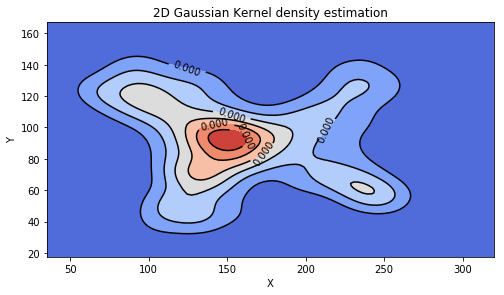

In [104]:
fig = plt.figure(figsize=(8,8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, cmap='coolwarm')
ax.imshow(np.rot90(f), cmap='coolwarm', extent=[xmin, xmax, ymin, ymax])
cset = ax.contour(xx, yy, f, colors='k')
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel('X')
ax.set_ylabel('Y')
plt.title('2D Gaussian Kernel density estimation')

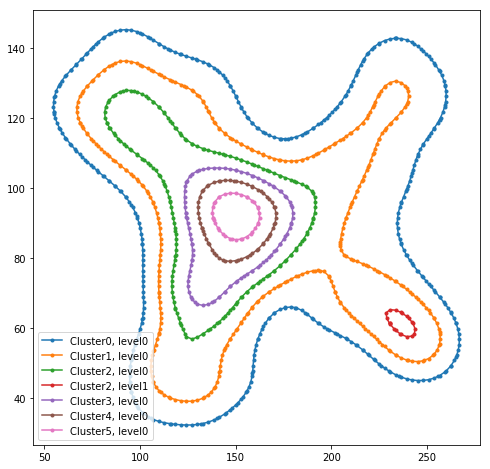

In [105]:
plt.figure(figsize=(8,8))

for j in range(len(cset.allsegs)):
    for ii, seg in enumerate(cset.allsegs[j]):
        plt.plot(seg[:,0], seg[:,1], '.-', label=f'Cluster{j}, level{ii}')

plt.legend()

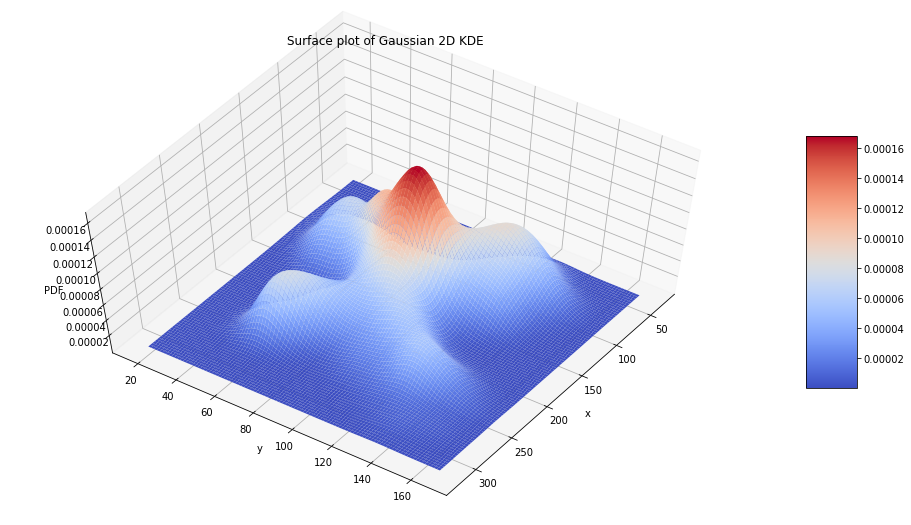

In [106]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(13, 7))
# ax = plt.axes(projection='3d')
ax = Axes3D(fig) #<-- Note the difference from your original code...
surf = ax.plot_surface(xx, yy, f, rstride=1, cstride=1, cmap='coolwarm', edgecolor='none')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Surface plot of Gaussian 2D KDE')
fig.colorbar(surf, shrink=0.5, aspect=5) # add color bar indicating the PDF
ax.view_init(60, 35)

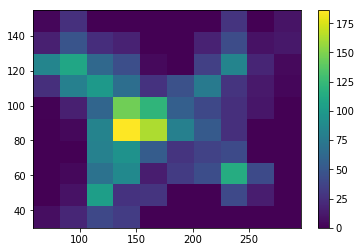

In [127]:
h =plt.hist2d(x, y)
plt.colorbar(h[3])

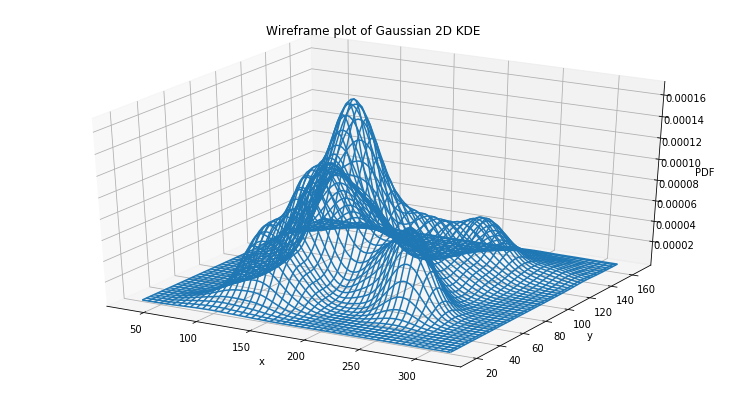

In [108]:
fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE');

In [109]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats


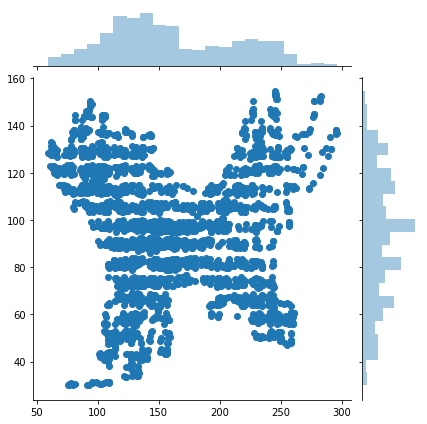

In [110]:
sns.jointplot(x=final_coords_X, y=final_coords_Y)

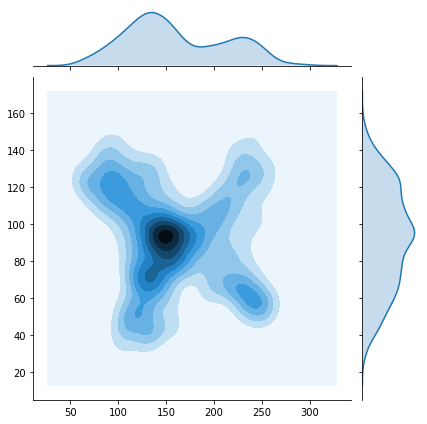

In [111]:
sns.jointplot(x=final_coords_X, y=final_coords_Y,  kind="kde");

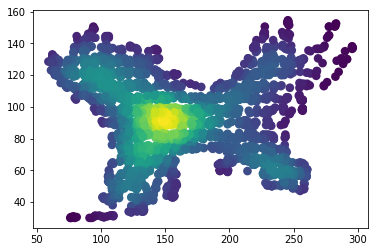

In [125]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# # Generate fake data
# x = np.random.normal(size=1000)
# y = x * 3 + np.random.normal(size=1000)

# Calculate the point density
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots()
ax.scatter(x, y, c=z, s=75, edgecolor='', )
plt.show()

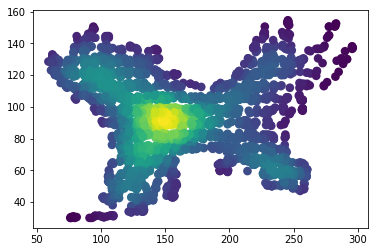

In [119]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Generate fake data
# x = np.random.normal(size=1000)
# y = x * 3 + np.random.normal(size=1000)

# Calculate the point density
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
# x, y, z = x[idx], y[idx], z[idx]

fig, ax = plt.subplots()
ax.scatter(x, y, c=z, s=75, edgecolor='')
plt.show()